# Test 1: Check if the downloaded files contain all images 


In [1]:
# import required module
import os
import json
nerfies_data_dir = '../datasets/kuoyuan_home_glass'
nerfies_camera_path = os.path.join(nerfies_data_dir, 'camera')
 
# iterate over files in nerfies_camera_path 
for filename in os.listdir(nerfies_camera_path):
    f = os.path.join(nerfies_camera_path, filename)
    # checking if it is a file
    if os.path.isfile(f):
        with open(f, 'r') as fp:
            meta = json.load(fp)

In [2]:
from importlib.metadata import metadata
import os
import json
import numpy as np
data_dir = '../datasets/kuoyuan_home_glass'
rgb_ds_path = os.path.join(data_dir, 'rgb/ds')
camera_path = os.path.join(data_dir, 'camera')
mesh_deformed_path = os.path.join(data_dir, 'mesh_deformed')
metadata_path = os.path.join(data_dir, 'metadata.json')

# for camera and rgb_4x, check if contain all images/their info

rgb_ds_file_names = os.listdir(rgb_ds_path)
rgb_ds_file = []
for rgb_ds_file_name in rgb_ds_file_names:
    if rgb_ds_file_name.endswith('.png'):
        rgb_ds_file.append(int(rgb_ds_file_name.strip().split('.')[0].split('_')[-1]))
    else:
        print('rgb file is not png')
        break


camera_file_names = os.listdir(camera_path)
camera_file = []
for camera_file_name in camera_file_names:
    if camera_file_name.endswith('.json'):
        camera_file.append(int(camera_file_name.strip().split('.')[0].split('_')[-1]))
    else:
        print('camera file is not json')
        break

assert sorted(camera_file) == sorted(rgb_ds_file)

# Test 2: test the load_blender and load_nerfies

In [ ]:
from load_blender import load_blender_data
from load_nerfies import load_nerfies_data
from matplotlib import pyplot as plt
# load_blender_data('./data/lego')
images, poses, warps, appearances, mesh_canonicals, mesh_deformeds,param_3DMM, near, far, hwf, i_split = load_nerfies_data('./../datasets/kuoyuan_home_glass',section='p2,p3')

In [4]:
print('Loaded nerfies', images.shape, poses.shape, warps.shape, appearances.shape, mesh_canonicals.shape, mesh_deformeds.shape,param_3DMM.shape, near, far, hwf)

Loaded nerfies (2170, 512, 512, 3) (2170, 4, 4) (2170,) (2170,) (2170, 5023, 3) (2170, 5023, 3) (2170, 56) 20 45 [512, 512, 1112.9267578125]


In [5]:
import plotly.graph_objs as go
import random
random_id = random.randrange(0,len(images))
fig = go.Figure()
fig.add_trace(go.Scatter3d(
    x=mesh_deformeds[random_id][:, 0],
    y=mesh_deformeds[random_id][:, 1],
    z=mesh_deformeds[random_id][:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.update_layout(scene_dragmode='orbit')
fig.show()

# Test 3: Check sample points and meshes

In [1]:
# Load the data
from load_nerfies import load_nerfies_data
from matplotlib import pyplot as plt
from run_dnerf_helpers import *
import random
images, poses, warps, appearances, mesh_canonicals, mesh_deformeds,param_3DMM, near, far, hwf, i_split = load_nerfies_data('./../datasets/kuoyuan_home_glass',section="p2,p3")
near = 20

: 

: 

In [7]:
# Use a random frame to test
random_id = random.randrange(0,len(images))
#random_id = 0
print(random_id)
H, W, focal = hwf
image = images[random_id]
pose = poses[random_id,:3, :4]

mesh_canonical = mesh_canonicals[random_id]
mesh_deformed = mesh_deformeds[random_id]

# Convert pose to ray_o and ray_d
rays_o, rays_d = get_rays(H, W, focal, torch.Tensor(pose), device = "cpu")

322


/data/gpfs/projects/punim1485/kuoyuanl/anaconda3/envs/rignerf/lib/python3.8/site-packages/torch/functional.py:504: UserWarning:

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666642975312/work/aten/src/ATen/native/TensorShape.cpp:3190.)



In [8]:
rays_o = torch.reshape(rays_o, [-1,3]).float() # flatten into (N_rays*N_samples, 3)
rays_d = torch.reshape(rays_d, [-1,3]).float()
near, far = near * torch.ones_like(rays_d[...,:1]), far * torch.ones_like(rays_d[...,:1])

In [9]:
N_rays = rays_o.shape[0]
N_samples = 64
z_vals = None
rgb_map_0, disp_map_0, acc_map_0, position_delta_0 = None, None, None, None

if z_vals is None: # True
    t_vals = torch.linspace(0., 1., steps=N_samples)
    z_vals = near * (1.-t_vals) + far * (t_vals)
    z_vals = z_vals.expand([N_rays, N_samples])

    if True:
        # get intervals between samples
        mids = .5 * (z_vals[...,1:] + z_vals[...,:-1])
        upper = torch.cat([mids, z_vals[...,-1:]], -1)
        lower = torch.cat([z_vals[...,:1], mids], -1)
        # stratified samples in those intervals
        t_rand = torch.rand(z_vals.shape)
        z_vals = lower + (upper - lower) * t_rand

    pts = rays_o[...,None,:] + rays_d[...,None,:] * z_vals[...,:,None] # [N_rays, N_samples, 3]

In [10]:
pts_plt = pts.reshape(-1, 3)
# randomly select 200 points from pts_plt
pts_plt = pts_plt[torch.randperm(pts_plt.shape[0])[:200]]

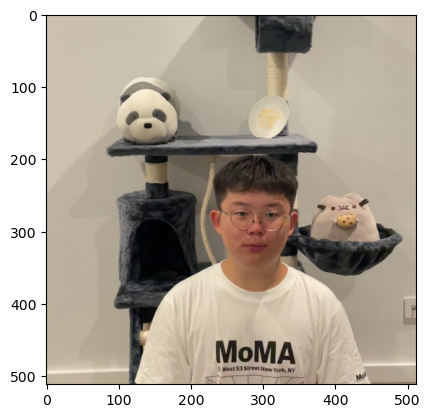

In [11]:
plt.imshow(image)

In [12]:
import plotly.graph_objs as go
fig = go.Figure()
fig.add_trace(go.Scatter3d(
    x=pts_plt[:,0],
    y=pts_plt[:,1],
    z=pts_plt[:,2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=mesh_deformed[:, 0],
    y=mesh_deformed[:, 1],
    z=mesh_deformed[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=mesh_canonical[:, 0],
    y=mesh_canonical[:, 1],
    z=mesh_canonical[:, 2],
    mode='markers',
    marker=dict(size=2),
))

fig.update_layout(scene_dragmode='orbit')
fig.show()

## Project mesh onto the image

In [13]:
# for each mesh point, plot the corresponding pixel
pixels = []
for point in mesh_deformed: #mesh_canonical:
    point_d = point - np.asarray(rays_o[0])
    point_d = point_d / np.linalg.norm(point_d)
    pixel = np.matmul(np.linalg.inv(pose[:3,:3]),point_d)
    x = pixel[0]*(1/pixel[2])
    y = pixel[1]*(1/pixel[2])
    pixels.append([x*focal+W*.5,y*focal+H*.5])
pixels = np.asarray(pixels)

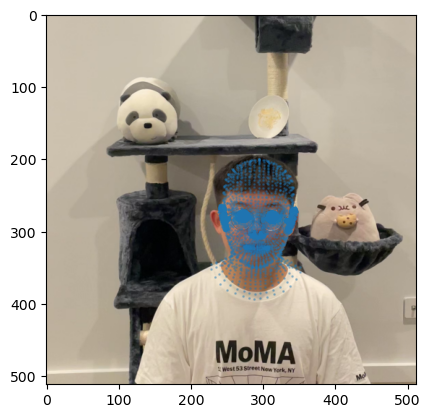

In [14]:
plt.imshow(image)
plt.scatter(x=pixels[:,0],y=pixels[:,1],s=1,alpha=0.3)
plt.show()

## Check the defom calculation

In [15]:
from scipy import spatial 
# Build the KDTree for deform_mesh
deform_mesh_tree = spatial.KDTree(mesh_deformed)
# For each point in the input, find the nearest point in the deform_mesh
distance_to_mesh, deform_mesh_idx = deform_mesh_tree.query(pts_plt.detach().cpu().numpy())
# Get the corresponding point in the deform_mesh
deform_mesh_points = mesh_deformed[deform_mesh_idx]
# Get the corresponding point in the canonical mesh
canonical_mesh_points = mesh_canonical[deform_mesh_idx]
# Calculate the deformation

deform = (canonical_mesh_points - deform_mesh_points)/(np.exp(distance_to_mesh).reshape(-1,1)) # shape: (N_rays*N_samples, 3)

In [16]:
pts_plt_det = pts_plt.detach().cpu().numpy()
deformed_pts = deform + pts_plt_det

In [17]:
## large deform
count = 0
pts_plt_ori = []
pts_plt_large_deform = []
for i in range(0,len(deform)):
    deform_val = deform[i]
    if np.linalg.norm(deform_val) > 0:
        count += 1
        pts_plt_ori.append(pts_plt_det[i])
        pts_plt_large_deform.append(deformed_pts[i])
pts_plt_ori = np.asarray(pts_plt_ori)
pts_plt_large_deform = np.asarray(pts_plt_large_deform)
print(count)

200


In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter3d(
    x=pts_plt_ori[:,0],
    y=pts_plt_ori[:,1],
    z=pts_plt_ori[:,2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=pts_plt_large_deform[:,0],
    y=pts_plt_large_deform[:,1],
    z=pts_plt_large_deform[:,2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=mesh_deformed[:, 0],
    y=mesh_deformed[:, 1],
    z=mesh_deformed[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=mesh_canonical[:, 0],
    y=mesh_canonical[:, 1],
    z=mesh_canonical[:, 2],
    mode='markers',
    marker=dict(size=2),
))

fig.update_layout(scene_dragmode='orbit')
fig.show()

# Test 4: Evaluate thought - transform mesh using predicted c2w

In [2]:
import os
import random
import numpy as np
import plotly.graph_objs as go
import cv2
from matplotlib import pyplot as plt
import json

In [3]:
root_dir = "../datasets/kuoyuan_home_glass"
rgb_path = os.path.join(root_dir, "rgb/ds")
deca_deform_path = os.path.join(root_dir, "deca_deform_out")
deca_canonical_path = os.path.join(root_dir, "deca_canonical_out")
deca_deformed_new = os.path.join(root_dir, "mesh_deformed")
camera_path = os.path.join(root_dir, "camera")
colmap_dir = os.path.join(root_dir, "colmap")
random_check = True
show_number = 3

In [4]:
def get_DECA_deform_mesh_colmap(image_id):
    deca_deformed_mesh_file = os.path.join(deca_deformed_new,image_id+'_mesh_colmap_coordinate.npy')
    deca_deformed_mesh = np.load(deca_deformed_mesh_file)
    deca_deformed_mesh = np.array(deca_deformed_mesh,dtype=np.float32)
    return deca_deformed_mesh


def get_DECA_deform_mesh(image_id,height,width):
    deca_deformed_mesh_file = os.path.join(deca_deform_path, image_id,image_id+'_verts.txt')
    deca_deformed_mesh = [] # load mesh to a list as [(x1,y1,z1),(x2,y2,z2),...], each correspond to a point in 3D mesh
    with open(deca_deformed_mesh_file,"r") as mesh_file:
        lines = mesh_file.readlines()
        for line in lines:
            points = line.strip().split(" ")
            deca_deformed_mesh.append([float(points[0])*(height/2)+height/2,float(points[1])*(width/2)+width/2,float(points[2])*(height/2)+height/2])
    deca_deformed_mesh = np.array(deca_deformed_mesh,dtype=np.float32)
    return deca_deformed_mesh

def get_camera_pose(image_id):
    camera_file = os.path.join(camera_path, image_id+'.json')
    camera = json.load(open(camera_file))
    camera_orientation = np.asarray(camera['orientation']).T
    camera_position = np.asarray(camera['position'])
    camera_pose = np.vstack([np.hstack([camera_orientation, camera_position.reshape(3,1)]), np.asarray([0,0,0,1])])
    camera_pose = camera_pose.astype(np.float32)
    return camera_pose


def get_2D_points(image_id,height,width):
    # vertices on image
    verts_2D_file = os.path.join(deca_deform_path, image_id,image_id+'_verts.txt')
    verts_2D = [] # load mesh to a list as [(x1,y1,z1),(x2,y2,z2),...], each correspond to a point in 3D mesh
    with open(verts_2D_file,"r") as file:
        lines = file.readlines()
        for line in lines:
            points = line.strip().split(" ")
            verts_2D.append([float(points[0])*(height/2)+height/2,float(points[1])*(width/2)+width/2])
    verts_2D = np.array(verts_2D,dtype=np.float32)
    
     # landmarks on image
    landmarks_2D_file = os.path.join(deca_deform_path, image_id,image_id+'_kpt3d.txt')
    landmarks_2D = [] # load mesh to a list as [(x1,y1,z1),(x2,y2,z2),...], each correspond to a point in 3D mesh
    with open(landmarks_2D_file,"r") as file:
        lines = file.readlines()
        for line in lines:
            points = line.strip().split(" ")[:2]
            landmarks_2D.append([float(points[0])*(height/2)+height/2,float(points[1])*(width/2)+width/2])
    landmarks_2D = np.array(landmarks_2D,dtype=np.float32)
    return verts_2D, landmarks_2D


p3_000596.png


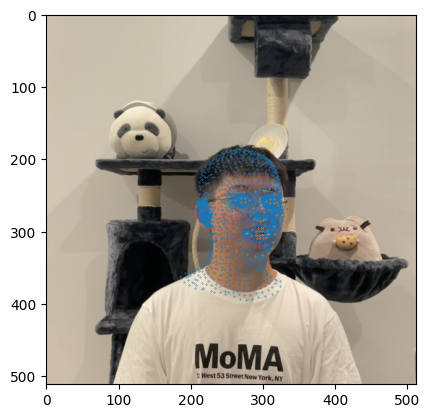

p2_000859.png


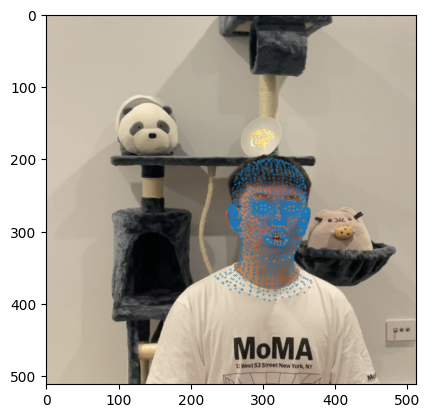

p2_000265.png


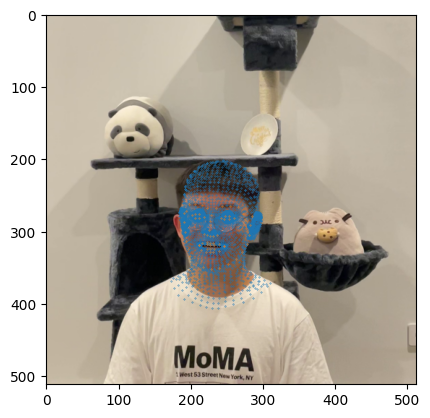

In [5]:
image_names = os.listdir(rgb_path)
if not random_check:
# Select a fixed image
    image_name_samples = ["02_000925","p2_001087","p3_000148.png","p3_000440.png","p3_000540.png"]
    image_name_samples = image_name_samples[:show_number]
else:
    # randomly select an image 
    image_name_samples= []
    for i in range(show_number):
        image_name_sample = random.choice(image_names)
        while image_name_sample.startswith('p1') or image_name_sample in image_name_samples:
            image_name_sample = random.choice(image_names)
        image_name_samples.append(image_name_sample)

deform_meshes = []
deform_meshes_colmap_true = []
for image_name_sample in image_name_samples:
    print(image_name_sample)
    image_path = os.path.join(rgb_path, image_name_sample)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # get image size and focal length
    H, W = image.shape[1],image.shape[0]
    focal = 1112.9267578125
    image_id = image_name_sample.split('.')[0]
    deform_mesh = get_DECA_deform_mesh(image_id,H, W)
    deform_meshes.append(deform_mesh)
    deform_mesh_colmap_true = get_DECA_deform_mesh_colmap(image_id)
    deform_meshes_colmap_true.append(deform_mesh_colmap_true)
    verts_2D,feature_2D = get_2D_points(image_id,H,W)
    camera_pose = get_camera_pose(image_id)
    plt.imshow(image)
    plt.scatter(verts_2D[:,0],verts_2D[:,1],s=0.1)
    plt.scatter(feature_2D[:,0],feature_2D[:,1],s=0.1)
    plt.show()


In [6]:
# show 3D mesh
fig = go.Figure()
for deform_mesh in deform_meshes:
    fig.add_trace(go.Scatter3d(
        x=deform_mesh[:, 0],
        y=deform_mesh[:, 1],
        z=deform_mesh[:, 2],
        mode='markers',
        marker=dict(size=2)
    ))
fig.update_layout(scene_dragmode='orbit')
fig.show()

In [12]:
# camera extrinsics
R = camera_pose[:3,:3]
t = camera_pose[:3,-1]

# convert the mesh from camera coordinate to world coordinate
# apply camera intrinsics
deform_mesh_colmap = deform_mesh.copy()
deform_mesh_colmap[:,0] = (deform_mesh_colmap[:,0]-W*0.5)/focal
deform_mesh_colmap[:,1] = (deform_mesh_colmap[:,1]-H*0.5)/focal
deform_mesh_colmap[:,2] = deform_mesh_colmap[:,2]/focal

deform_mesh_colmap[:,0] = deform_mesh_colmap[:,0]*deform_mesh_colmap[:,2]
deform_mesh_colmap[:,1] = deform_mesh_colmap[:,1]*deform_mesh_colmap[:,2]
# deform_mesh_colmap[:,2] = deform_mesh_colmap[:,2]*deform_mesh_colmap[:,2]

# apply camera extrinsics
deform_mesh_colmap = [R@(deform_mesh_colmap[i])+t for i in range(len(deform_mesh_colmap))]
deform_mesh_colmap = np.array(deform_mesh_colmap)

In [13]:
# show deform_mesh_colmap in 3D
fig = go.Figure()
fig.add_trace(go.Scatter3d(
    x=deform_mesh_colmap[:, 0],
    y=deform_mesh_colmap[:, 1],
    z=deform_mesh_colmap[:, 2],
    mode='markers',
    marker=dict(size=2)
))
fig.add_trace(go.Scatter3d(
    x=deform_mesh_colmap_true[:, 0],
    y=deform_mesh_colmap_true[:, 1],
    z=deform_mesh_colmap_true[:, 2],
    mode='markers',
    marker=dict(size=2)
))

fig.update_layout(scene_dragmode='orbit')
fig.show()

/var/folders/6_/jcbch6716wb2wwp12b05_lkr0000gn/T/ipykernel_48798/1593797167.py:7: RuntimeWarning:

invalid value encountered in divide



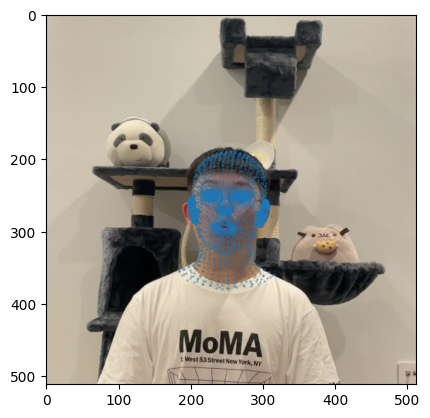

In [16]:
rays_o = camera_pose[:3,-1]

# for each mesh point, plot the corresponding pixel
pixels = []
for point in deform_mesh_colmap: 
    point_d = point - np.asarray(rays_o)
    point_d = point_d / np.linalg.norm(point_d)
    pixel = np.matmul(np.linalg.inv(camera_pose[:3,:3]),point_d)
    # x,y = pixel[0],pixel[1]
    x = pixel[0]*(1/pixel[2])
    y = pixel[1]*(1/pixel[2])
    pixels.append([x*focal+W*.5,y*focal+H*.5])
pixels = np.asarray(pixels)

plt.imshow(image)
plt.scatter(x=pixels[:,0],y=pixels[:,1],s=1,alpha=0.3)
plt.show()

# Test 5: Show the scene points and mesh(es)

In [1]:
import os
import random
import numpy as np
import plotly.graph_objs as go
import cv2
from matplotlib import pyplot as plt

In [6]:
root_dir = "../datasets/kuoyuan_home_glass"
rgb_path = os.path.join(root_dir, "rgb/ds")
deca_deform_path = os.path.join(root_dir, "deca_deform_out")
deca_deformed_new  =  os.path.join(root_dir, "mesh_deformed")
deca_canonical_new  =  os.path.join(root_dir, "mesh_canonical")
colmap_dir = os.path.join(root_dir, "colmap")
random_check = True

In [7]:
def get_DECA_deform_mesh(image_id):
    deca_deformed_mesh_file = os.path.join(deca_deformed_new,image_id+'_mesh_colmap_coordinate.npy')
    deca_deformed_mesh = np.load(deca_deformed_mesh_file)
    deca_deformed_mesh = np.array(deca_deformed_mesh,dtype=np.float32)
    return deca_deformed_mesh

def get_DECA_canonical_mesh(): 
    deca_canonical_mesh_file = os.path.join(deca_canonical_new, 'canonical_mesh_colmap_coordinate.npy')
    deca_canonical_mesh = np.load(deca_canonical_mesh_file)
    deca_canonical_mesh = np.array(deca_canonical_mesh,dtype=np.float32)
    return deca_canonical_mesh

def get_2D_points(image_id,height,width):
    # vertices on image
    verts_2D_file = os.path.join(deca_deform_path, image_id,image_id+'_verts.txt')
    verts_2D = [] # load mesh to a list as [(x1,y1,z1),(x2,y2,z2),...], each correspond to a point in 3D mesh
    with open(verts_2D_file,"r") as file:
        lines = file.readlines()
        for line in lines:
            points = line.strip().split(" ")
            verts_2D.append([float(points[0])*(height/2)+height/2,float(points[1])*(width/2)+width/2])
    verts_2D = np.array(verts_2D,dtype=np.float32)
    
     # landmarks on image
    landmarks_2D_file = os.path.join(deca_deform_path, image_id,image_id+'_kpt3d.txt')
    landmarks_2D = [] # load mesh to a list as [(x1,y1,z1),(x2,y2,z2),...], each correspond to a point in 3D mesh
    with open(landmarks_2D_file,"r") as file:
        lines = file.readlines()
        for line in lines:
            points = line.strip().split(" ")[:2]
            landmarks_2D.append([float(points[0])*(height/2)+height/2,float(points[1])*(width/2)+width/2])
    landmarks_2D = np.array(landmarks_2D,dtype=np.float32)
    return verts_2D, landmarks_2D

p3_001021.png


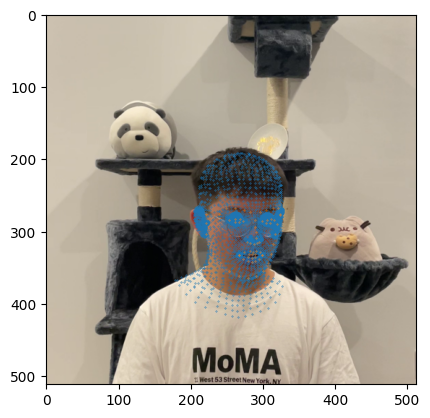

In [39]:
image_names = os.listdir(rgb_path)
if not random_check:
# Select a fixed image
    image_name_sample = "p3_000715.png"
else:
    # randomly select an image 
    image_name_sample = random.choice(image_names)
    while image_name_sample.startswith('p1'):
        image_name_sample = random.choice(image_names)
print(image_name_sample)

image_path = os.path.join(rgb_path, image_name_sample)
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_id = image_name_sample.split('.')[0]
verts_2D,landmarks_2D = get_2D_points(image_id,image.shape[1],image.shape[0])
plt.imshow(image)
plt.scatter(verts_2D[:,0],verts_2D[:,1],s=0.1)
plt.scatter(landmarks_2D[:,0],landmarks_2D[:,1],s=0.1)
plt.show()

In [40]:
# @title Define Scene Manager.
from absl import logging
from typing import Dict
import numpy as np
from nerfies.camera import Camera
import pycolmap
from pycolmap import Quaternion
from pathlib import Path
import cv2

def convert_colmap_camera(colmap_camera, colmap_image):
  """Converts a pycolmap `image` to an SFM camera.
  SFM camera is the defined camera class (in nerfies camera.py)
  """

  camera_rotation = colmap_image.R()
  camera_position = -(colmap_image.t @ camera_rotation)
  #print(colmap_camera)
  # Model, width, height, f (focal), cx, cy (principal point), k(distortion)
  # SIMPLE_RADIAL 540 960 829.4165762600147 270.0 480.0 -0.02138539392187597
  new_camera = Camera(
      orientation=camera_rotation,
      position=camera_position,
      focal_length=colmap_camera.fx,
      pixel_aspect_ratio=colmap_camera.fx / colmap_camera.fx,
      principal_point=np.array([colmap_camera.cx, colmap_camera.cy]),
      radial_distortion=np.array([colmap_camera.k1, colmap_camera.k1, 0.0]),
      #tangential_distortion=np.array([colmap_camera.p1, colmap_camera.p2]),
      skew=0.0,
      image_size=np.array([colmap_camera.width, colmap_camera.height])
  )
  return new_camera


def filter_outlier_points(points, inner_percentile):
  """Filters outlier points. (points that are outside the major clusters)"""
  outer = 1.0 - inner_percentile
  lower = outer / 2.0
  upper = 1.0 - lower
  centers_min = np.quantile(points, lower, axis=0)
  centers_max = np.quantile(points, upper, axis=0)
  result = points.copy()

  too_near = np.any(result < centers_min[None, :], axis=1)
  too_far = np.any(result > centers_max[None, :], axis=1)

  return result[~(too_near | too_far)]


def average_reprojection_errors(points, pixels, cameras): # not used
  """Computes the average reprojection errors of the points."""
  cam_errors = []
  for i, camera in enumerate(cameras):
    cam_error = reprojection_error(points, pixels[:, i], camera)
    cam_errors.append(cam_error)
  cam_error = np.stack(cam_errors)

  return cam_error.mean(axis=1)


def _get_camera_translation(camera):
  """Computes the extrinsic translation of the camera."""
  rot_mat = camera.orientation
  return -camera.position.dot(rot_mat.T)


def _transform_camera(camera, transform_mat):
  """Transforms the camera using the given transformation matrix."""
  # The determinant gives us volumetric scaling factor.
  # Take the cube root to get the linear scaling factor.
  scale = np.cbrt(linalg.det(transform_mat[:, :3]))
  quat_transform = ~Quaternion.FromR(transform_mat[:, :3] / scale)

  translation = _get_camera_translation(camera)
  rot_quat = Quaternion.FromR(camera.orientation)
  rot_quat *= quat_transform
  translation = scale * translation - rot_quat.ToR().dot(transform_mat[:, 3])
  new_transform = np.eye(4)
  new_transform[:3, :3] = rot_quat.ToR()
  new_transform[:3, 3] = translation

  rotation = rot_quat.ToR()
  new_camera = camera.copy()
  new_camera.orientation = rotation
  new_camera.position = -(translation @ rotation)
  return new_camera


def _pycolmap_to_sfm_cameras(manager: pycolmap.SceneManager) -> Dict[int, Camera]:
  """Creates SFM cameras."""
  # Use the original filenames as indices.
  # This mapping necessary since COLMAP uses arbitrary numbers for the
  # image_id.
  image_id_to_colmap_id = {
      image.name.split('.')[0]: image_id
      for image_id, image in manager.images.items()
  }

  sfm_cameras = {}
  for image_id in image_id_to_colmap_id:
    colmap_id = image_id_to_colmap_id[image_id]
    image = manager.images[colmap_id]
    camera = manager.cameras[image.camera_id]
    sfm_cameras[image_id] = convert_colmap_camera(camera, image)

  return sfm_cameras


class SceneManager:
  """A thin wrapper around pycolmap."""

  @classmethod
  def from_pycolmap(cls, colmap_path, image_path, min_track_length=10):
    """Create a scene manager using pycolmap."""
    manager = pycolmap.SceneManager(str(colmap_path))
    manager.load_cameras()
    manager.load_images()
    manager.load_points3D()
    manager.filter_points3D(min_track_len=min_track_length)
    sfm_cameras = _pycolmap_to_sfm_cameras(manager)
    return cls(sfm_cameras, manager.get_filtered_points3D(), image_path)

  def __init__(self, cameras, points, image_path):
    self.image_path = Path(image_path)
    self.camera_dict = cameras
    self.points = points

    logging.info('Created scene manager with %d cameras', len(self.camera_dict))

  def __len__(self):
    return len(self.camera_dict)

  @property
  def image_ids(self):
    return sorted(self.camera_dict.keys())

  @property
  def camera_list(self):
    return [self.camera_dict[i] for i in self.image_ids]

  @property
  def camera_positions(self):
    """Returns an array of camera positions."""
    return np.stack([camera.position for camera in self.camera_list])

  def load_image(self, image_id):
    """Loads the image with the specified image_id."""
    path = self.image_path / f'{image_id}.png'
    with path.open('rb') as f:
      return imageio.imread(f)

  def triangulate_pixels(self, pixels):
    """Triangulates the pixels across all cameras in the scene.

    Args:
      pixels: the pixels to triangulate. There must be the same number of pixels
        as cameras in the scene.

    Returns:
      The 3D points triangulated from the pixels.
    """
    if pixels.shape != (len(self), 2):
      raise ValueError(
          f'The number of pixels ({len(pixels)}) must be equal to the number '
          f'of cameras ({len(self)}).')

    return triangulate_pixels(pixels, self.camera_list)

  def change_basis(self, axes, center):
    """Change the basis of the scene.

    Args:
      axes: the axes of the new coordinate frame.
      center: the center of the new coordinate frame.

    Returns:
      A new SceneManager with transformed points and cameras.
    """
    transform_mat = np.zeros((3, 4))
    transform_mat[:3, :3] = axes.T
    transform_mat[:, 3] = -(center @ axes)
    return self.transform(transform_mat)

  def transform(self, transform_mat):
    """Transform the scene using a transformation matrix.

    Args:
      transform_mat: a 3x4 transformation matrix representation a
        transformation.

    Returns:
      A new SceneManager with transformed points and cameras.
    """
    if transform_mat.shape != (3, 4):
      raise ValueError('transform_mat should be a 3x4 transformation matrix.')

    points = None
    if self.points is not None:
      points = self.points.copy()
      points = points @ transform_mat[:, :3].T + transform_mat[:, 3]

    new_cameras = {}
    for image_id, camera in self.camera_dict.items():
      new_cameras[image_id] = _transform_camera(camera, transform_mat)

    return SceneManager(new_cameras, points, self.image_path)

  def filter_images(self, image_ids):
    num_filtered = 0
    for image_id in image_ids:
      if self.camera_dict.pop(image_id, None) is not None:
        num_filtered += 1

    return num_filtered


In [41]:
from pathlib import Path

scene_manager = SceneManager.from_pycolmap(
    os.path.join(colmap_dir, 'sparse/0'), 
    rgb_path, 
    min_track_length=5)


In [42]:
import copy 
filtered_points = copy.deepcopy(scene_manager.points)
filtered_points = np.array([i for i in filtered_points if i[2]<50])

# add head mesh into it
image_name_id = image_name_sample.strip().split('.')[0]
deform_mesh_colmap = get_DECA_deform_mesh(image_name_id)

### Show in colmap coordinate

In [43]:
# load canonical and deformed mesh
canonical_mesh_colmap = get_DECA_canonical_mesh()
fig = go.Figure()
fig.add_trace(go.Scatter3d(
    x=filtered_points[:, 0],
    y=filtered_points[:, 1],
    z=filtered_points[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=scene_manager.camera_positions[:, 0],
    y=scene_manager.camera_positions[:, 1],
    z=scene_manager.camera_positions[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=deform_mesh_colmap[:, 0],
    y=deform_mesh_colmap[:, 1],
    z=deform_mesh_colmap[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=canonical_mesh_colmap[:, 0],
    y=canonical_mesh_colmap[:, 1],
    z=canonical_mesh_colmap[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.update_layout(scene_dragmode='orbit')
fig.show()

### Project onto the image

In [44]:
import torch
H, W = scene_manager.camera_dict[image_name_id].to_json()['image_size'][0],scene_manager.camera_dict[image_name_id].to_json()['image_size'][1]
focal = scene_manager.camera_dict[image_name_id].to_json()['focal_length']

camera_orientation = np.array(scene_manager.camera_dict[image_name_id].to_json()['orientation']).T
camera_position = np.asarray(np.array(scene_manager.camera_dict[image_name_id].to_json()['position']))
camera_pose = np.vstack([np.hstack([camera_orientation, camera_position.reshape(3,1)]), np.asarray([0,0,0,1])])
camera_pose = camera_pose.astype(np.float32)
del camera_orientation, camera_position, scene_manager

In [45]:
rays_o = camera_pose[:3,-1]

In [46]:
# for each mesh point, plot the corresponding pixel
pixels = []
for point in deform_mesh_colmap: 
    point_d = point - np.asarray(rays_o)
    point_d = point_d / np.linalg.norm(point_d) # normalize, then times the focal length
    point_d = point_d * focal # now is the vector from camera center to the point in the image plane
    pixel = np.matmul(np.linalg.inv(camera_pose[:3,:3]),point_d) # transform to the camera coordinate
    x,y=pixel[0],pixel[1]
    pixels.append([x+W*.5,y+H*.5])
pixels = np.asarray(pixels)

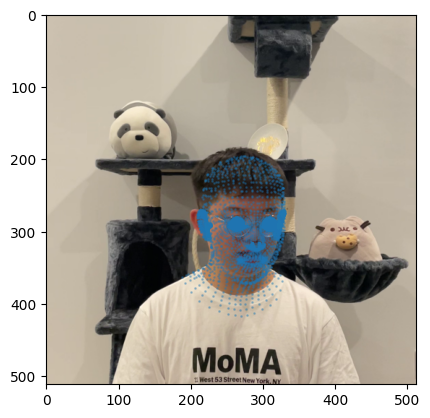

In [47]:
plt.imshow(image)
plt.scatter(x=pixels[:,0],y=pixels[:,1],s=1,alpha=0.3)
plt.show()